In [2]:
using Interpolations
using NPZ
using DifferentialEquations
using Plots
using PyPlot 
import PyPlot
using LaTeXStrings
using Statistics
using PyCall

In [3]:
using FFTW

In [4]:
using Sundials

In [1]:
na = CartesianIndex();

In [42]:
bpsi = npzread("/net/scratch3/giannis_kx/pixie3d/iter/iter3d/db_new/dt.scratch/b_hat_rho_mpi_nm.npy");
#bpsi = npzread("/net/scratch3/giannis_kx/pixie3d/iter/iter3d/db_tear/dt_sh_m3_n2.scratch/" *  "b_hat_rho_mpi.npy");

In [43]:
q = npzread("/net/scratch3/giannis_kx/pixie3d/iter/iter3d/db_new/dt.scratch/q_mpi_nm.npy");
#q = npzread("/net/scratch3/giannis_kx/pixie3d/iter/iter3d/db_tear/dt_sh_m3_n2.scratch/" * "q_mpi_DF.npy");

In [22]:
size(bpsi)

(101, 65, 33, 200)

## Spline the Fields

In [44]:
# Node-based grid
tn = LinRange(0, size(bpsi)[4]-1,size(bpsi)[4]);
psin = LinRange(0.0,1.0,size(bpsi)[1]);
ufn = LinRange(0.0,2.0*pi,size(bpsi)[2]);
phin = LinRange(0.0,2.0*pi,size(bpsi)[3]);

In [45]:
bpsi_int = Interpolations.interpolate(bpsi,(BSpline(Cubic(Line(OnGrid()))),BSpline(Cubic(Periodic(OnGrid()))),BSpline(Cubic(Periodic(OnGrid()))),BSpline(Cubic(Line(OnGrid())))));
q_int = Interpolations.interpolate(q,(BSpline(Cubic(Line(OnGrid()))),BSpline(Cubic(Line(OnGrid())))));

In [46]:
bpsi_sint = scale(bpsi_int,psin,ufn,phin,tn);
q_sint = scale(q_int,psin,tn);

In [47]:
bpsi_eint = extrapolate(bpsi_sint, (Line(),Periodic(),Periodic(),Line()));
q_eint = extrapolate(q_sint, (Line(),Line()));

## Integrator

In [48]:
function Field_line!(du,u,p,t)
    du[1] = bpsi_eint(u[1],u[2],u[3],p[1])
    du[2] = 1
    du[3] = q_eint(u[1],p[1])
end

function condition_cross(u,t,integrator)
    u[3] - integrator.p[2]*2.0*pi
end
function count_cross!(integrator)
    integrator.p[2] = integrator.p[2]+1
end

cb1 = ContinuousCallback(condition_cross,count_cross!,rootfind = true,save_positions=(false,true))

function field_line_integration(psis::Float64,ufs::Float64,time::Int)
    u0 = [psis,ufs,0.0]
    p = [time,1]
    tspan = (0.0,20080.0)
    prob = ODEProblem(Field_line!,u0,tspan,p)
    sol = solve(prob,CVODE_BDF(),callback = cb1, reltol=1.e-10,abstol=1.e-10,save_everystep=false,save_start=false, save_end=false)
    return sol
end

field_line_integration (generic function with 1 method)

In [49]:
function Poincare_Map(N::Int,t::Int)
    ic = LinRange(0,0.99,N)
    psin = [[] for i in 1:N]
    thetaf = [[] for i in 1:N]
    phi = [[] for i in 1:N]
    for i in 1:N
        sol = field_line_integration(ic[i],0.0,t)
        psin[i] = sol[1,:]
        thetaf[i] = sol[2,:]
        phi[i] = sol[3,:]
    end
    return psin, thetaf
end

Poincare_Map (generic function with 1 method)

In [50]:
sol = field_line_integration(0.4,0.0,100);

In [51]:
ufsol = [mod2pi(x) for x in sol[2,:]];

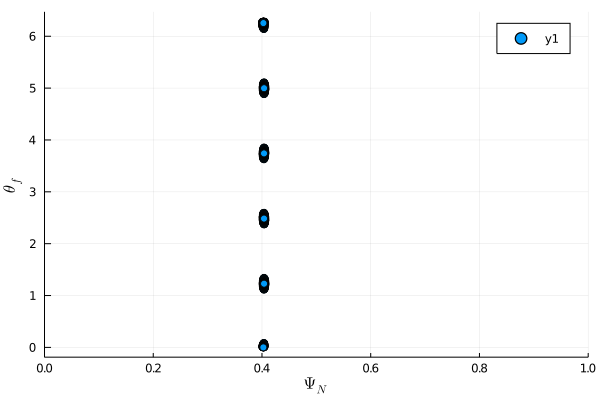

In [52]:
Plots.plot()
Plots.scatter!(sol[1,:],ufsol,xlims=(0.0,1.0))
xlabel!(L"\Psi_N")
ylabel!(L"\theta_f")

In [53]:
P,U = Poincare_Map(8,110);

In [55]:
Plots.plot();
for i in 1:8
    Plots.scatter!(P[i,:],[mod2pi(x) for x in U[i][:]],xlims=(0.0,1.0),markerstrokewidth=0,markersize=1.0,legend=false)
    xlabel!(L"\Psi_N")
    ylabel!(L"\theta_f")
    title!("t=1,L=180")
end
current()

In [51]:
P1,U1 = Poincare_Map(4,140);

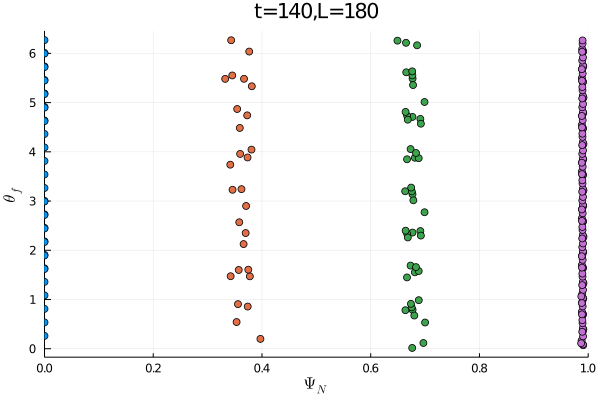

In [79]:
Plots.plot();
for i in 1:4
    Plots.scatter!(P1[i,:],[mod2pi(x) for x in U1[i][:]],xlims=(0.0,1.0),legend=false)
    xlabel!(L"\Psi_N")
    ylabel!(L"\theta_f")
    title!("t=140,L=180")
end
current()

In [53]:
P2,U2 = Poincare_Map(4,190);

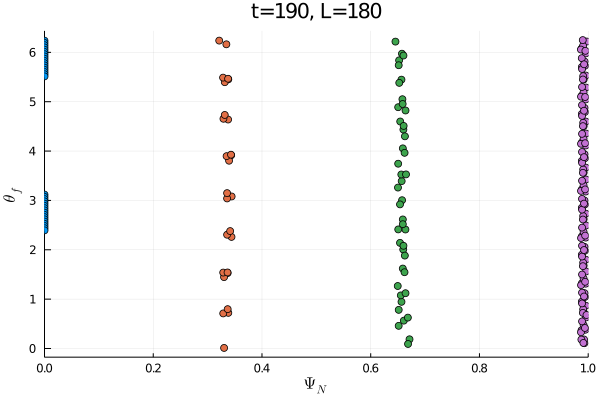

In [78]:
Plots.plot();
for i in 1:4
    Plots.scatter!(P2[i,:],[mod2pi(x) for x in U2[i][:]],xlims=(0.0,1.0),legend=false)
    xlabel!(L"\Psi_N")
    ylabel!(L"\theta_f")
    title!("t=190, L=180")
end
current()

In [63]:
P3,U3 = Poincare_Map(10,160);

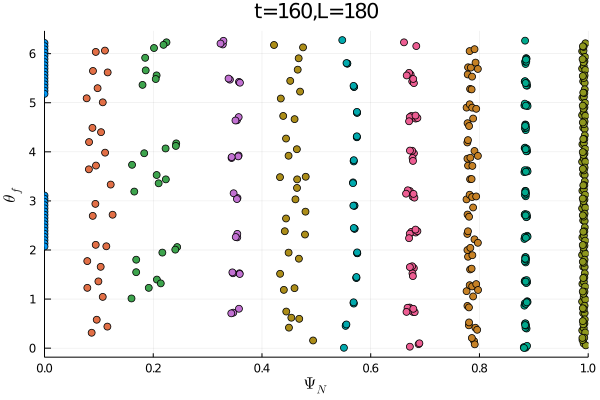

In [76]:
Plots.plot();
for i in 1:10
    Plots.scatter!(P3[i,:],[mod2pi(x) for x in U3[i][:]],xlims=(0.0,1.0),legend=false)
    xlabel!(L"\Psi_N")
    ylabel!(L"\theta_f")
    title!("t=160,L=180")
end
current()

In [66]:
P4,U4 = Poincare_Map(10,160);

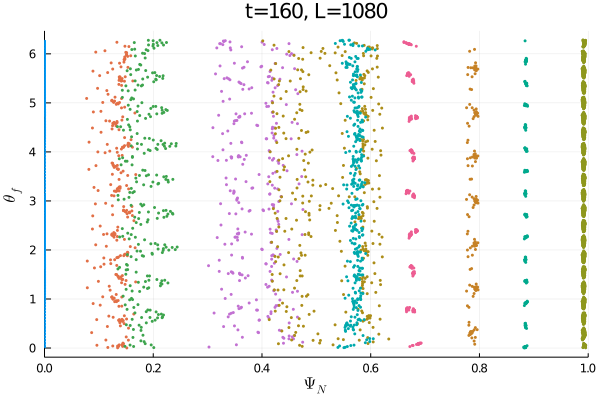

In [75]:
Plots.plot();
for i in 1:10
    Plots.scatter!(P4[i,:],[mod2pi(x) for x in U4[i][:]],xlims=(0.0,1.0),markerstrokewidth=0,markersize=1.9,legend=false)
    xlabel!(L"\Psi_N")
    ylabel!(L"\theta_f")
    title!("t=160, L=1080")
end
current()